### **ENPM 673 (Project 3)**
# Problem 1

In [ ]:
import cv2
import numpy as np
import math
import glob
import pickle
import matplotlib.pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
from IPython.display import clear_output
import os
import re

**Importing Drive**

---


Drive link of 50 originally distorted images: https://drive.google.com/drive/folders/1RhJFjtUnAGKvpp8VtwYrJYyqcTCMVLiK?usp=sharing

Drive link of final plotted corners on original images: https://drive.google.com/drive/folders/10ogigu-e2Sw3nSnMu5r7bqXAZlxtNKKX?usp=sharing



In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)
# Change the working directory
path_to_folder = "ENPM673/tutorials/assets/camera_caliberation"
%cd /content/drive/My\ Drive/{path_to_folder}

Mounted at /content/drive/
/content/drive/My Drive/ENPM673/tutorials/assets/camera_caliberation


### Calibration Pipeline

Following is the explanation of the whole pipeline used below for camera caliberation using:


* Defining the chessboard size and image frame size.
Prepare object points and arrays to store object points and distorted corner points.
* Iterating through the distorted images, find chessboard corners, refine them, and store the corners' coordinates.
* Drawing the detected corners on the images and save them in a new folder.
* **Camera Calibration and Undistortion:**
*(This process involves identifying key features in two images using SIFT, matching these features to compute the Fundamental matrix, deriving the Essential matrix for camera geometry, applying rectification for horizontal alignment of corresponding points, visualizing epipolar lines, and computing depth from disparities between rectified images, resulting in a 3D depth map of the scene)
*Calibrating the camera using cv2.calibrateCamera with the object points and distorted corner points.
* Undistorting the distorted images using the calibrated camera matrix and distortion coefficients.
* Saving the undistorted images in a new folder.
* **Capturing Undistorted Corners:**
*Iterating through the undistorted images, find chessboard corners, refine them, and store the corners' coordinates.
*Drawing the detected corners on the undistorted images and save them in a new folder.
* **Saving Calibration Data:**
* Saving the camera calibration data including object points, camera matrix, distortion coefficients, and undistorted corners.
* **Calculate Reprojection Error:**
* Calculating the reprojection error to evaluate the accuracy of the camera calibration and distortion correction.
* Plot the reprojection errors and display the mean reprojection error.


###Loading the original/distorted images and finding corners

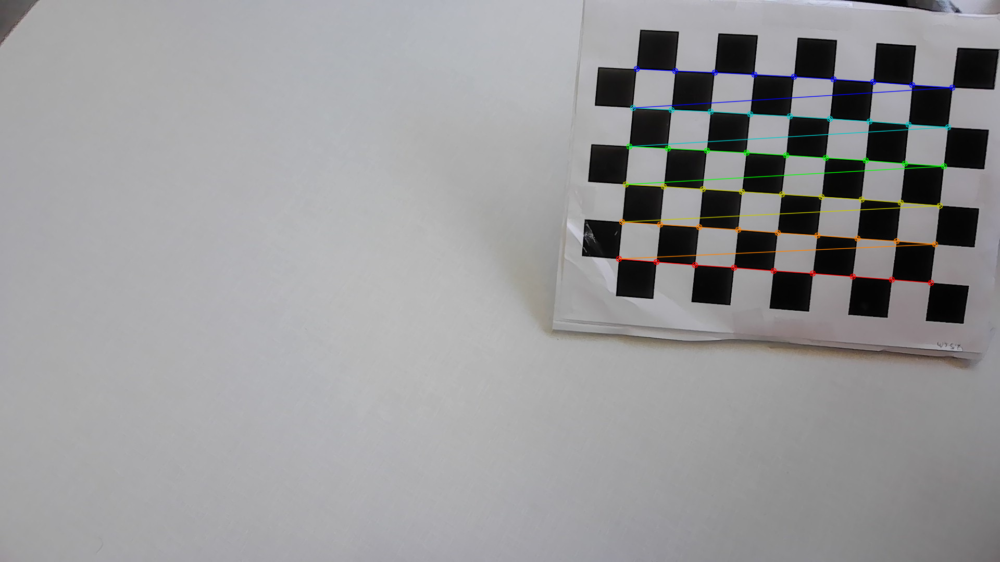

In [ ]:
#Defining standard chessboard
chessboardSize = (9,6)
frameSize = (1920, 1080)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chessboardSize[0] * chessboardSize[1], 3), np.float32)
objp[:,:2] = np.mgrid[0:chessboardSize[0],0:chessboardSize[1]].T.reshape(-1,2)
size_of_chessboard_squares_mm = 20
objp = objp * size_of_chessboard_squares_mm

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
dist_corners = [] # 2d points in image plane.

images = sorted(glob.glob("distorted_images/*.jpg"), key=lambda x: int(re.findall(r'\d+', x)[-1]))

for image_path in images:
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, chessboardSize, None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        dist_corners.append(corners2)
        cv2.drawChessboardCorners(img, chessboardSize, corners2, ret)
        cv2.imwrite("distorted_processed_image/image" + str(len(dist_corners)) + ".jpg", img)
        cv2_imshow(img)
        clear_output(True)

ret, cameraMatrix, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, dist_corners, frameSize, None, None)


Drive link of corners before undistorting image: https://drive.google.com/drive/folders/1Pm9NSMlb7CCZyIRfbe-5UzNReuYzJ4Yo

### Undistroting the image using caliberated data

In [ ]:
# Undistortion

images = sorted(glob.glob("distorted_images/*.jpg"), key=lambda x: int(re.findall(r'\d+', x)[-1]))
for index, img_path in enumerate(images, start=1):
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    newCameraMatrix, roi = cv2.getOptimalNewCameraMatrix(cameraMatrix, dist, (w,h), 1, (w,h))

    # Undistort
    dst = cv2.undistort(img, cameraMatrix, dist, None, newCameraMatrix)

    # Undistort with Remapping
    mapx, mapy = cv2.initUndistortRectifyMap(cameraMatrix, dist, None, newCameraMatrix, (w,h), 5)
    dst = cv2.remap(img, mapx, mapy, cv2.INTER_LINEAR)

    # Crop the image
    x, y, w, h = roi
    dst = dst[y:y+h, x:x+w]
    cv2.imwrite('undistorted_image/image' + str(index) + '.jpg', dst)


Undistorted image sample 



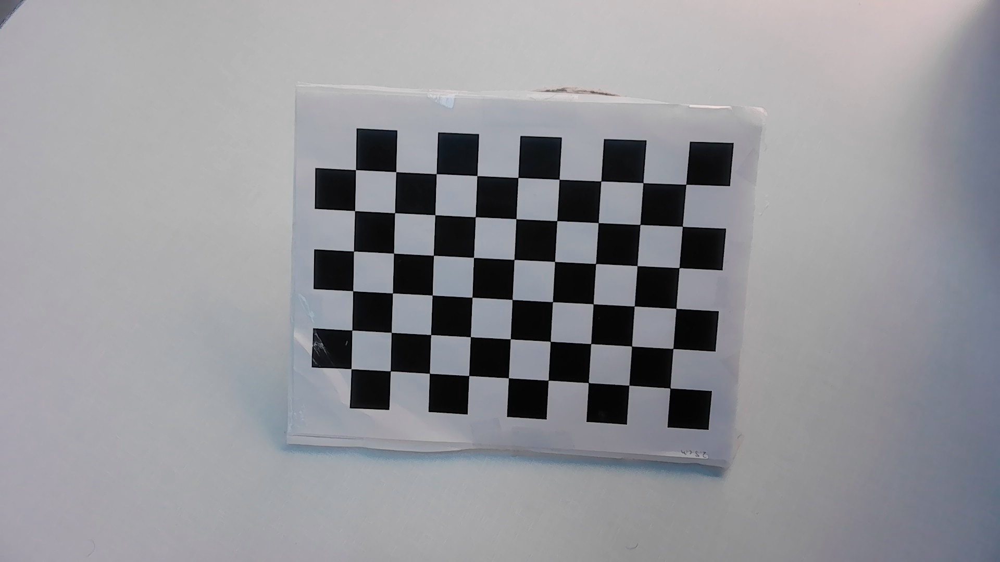

In [ ]:
 # Displaying undistorteed image result
print("Undistorted image sample", "\n")
img = cv2.imread(images[1])
img_sample2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
cv2_imshow(img_sample2)

###Finding corners of undistorted images

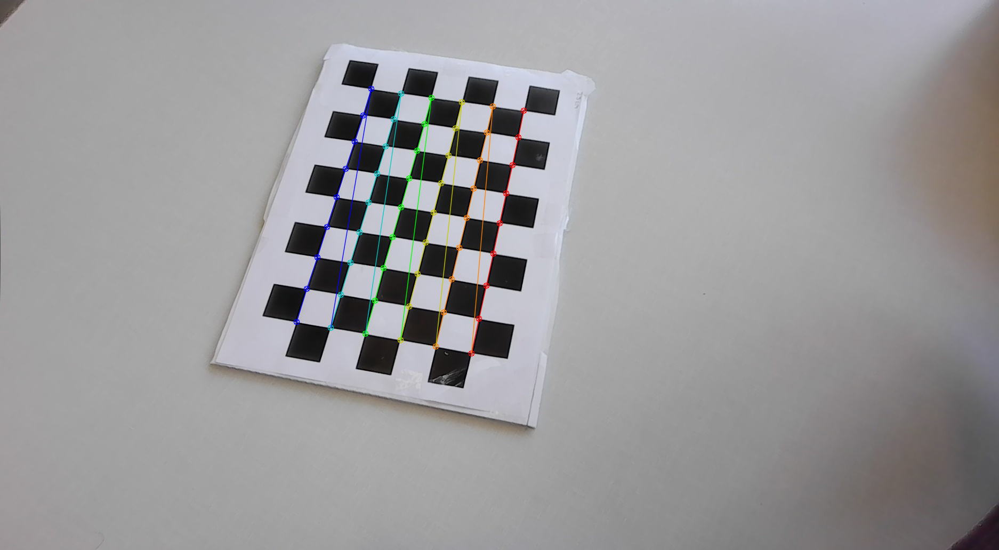

In [ ]:
index = 0 # counter initaiated
undist_corners = []
#Loading "sorted" images to avoid mismatched corners
images = sorted(glob.glob("undistorted_image/*.jpg"), key=lambda x: int(re.findall(r'\d+', x)[-1]))

for image_path in images:
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, chessboardSize, None)

    # If found, add object points, image points (after refining them)
    if ret == True:
        index += 1
        objpoints.append(objp)
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        undist_corners.append(corners2)
        cv2.drawChessboardCorners(img, chessboardSize, corners2, ret)
        cv2.imwrite('undistorted_processed_image/image' + str(index) + '.jpg', img)
        cv2_imshow(img)
        clear_output(True)


Drive link of corners plotted after undistorting image: https://drive.google.com/drive/folders/1dCjJWPlAmA4xBBY-GURuGizP7Sa9fdp1

In [ ]:
# Save the camera calibration result for later use
pickle.dump((objpoints, cameraMatrix, dist, undist_corners), open("caliberated_data/calibration.pkl", "wb"))
pickle.dump(cameraMatrix, open("caliberated_data/cameraMatrix.pkl", "wb"))
pickle.dump(dist, open("caliberated_data/dist.pkl", "wb"))
pickle.dump(undist_corners, open("caliberated_data/undist_corners.pkl", "wb"))

###Plotting corners on original image

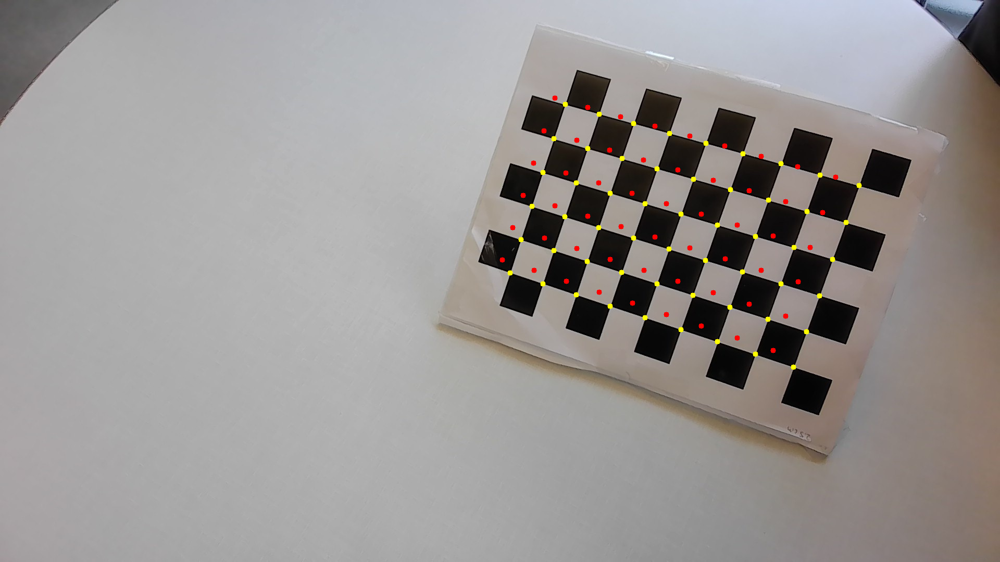

In [ ]:
#Loading distorted images again
images = glob.glob('distorted_images/*.jpg')
for index, img_path in enumerate(images, start=1):
    img = cv2.imread(img_path)

    # Plot distorted corners
    for corner in dist_corners[index-1]:
        x, y = corner.ravel().astype(int)  # Ensure x and y are integers
        center = (x, y)  # Center coordinates as tuple
        cv2.circle(img, center, 5, (0, 255, 255), -1)

    # Plot undistorted corners
    for corner in undist_corners[index-1]:
        x, y = corner.ravel().astype(int)  # Ensure x and y are integers
        center = (x, y)  # Center coordinates as tuple
        cv2.circle(img, center, 5, (0, 0, 255), -1)

    # Save the modified image with a unique filename
    filename = f'plotted_corners/image{index}.jpg'
    cv2.imwrite(filename, img)
    cv2_imshow(img)
    clear_output(True)


###Calculating error in original/distorted and undistorteed images

In [ ]:
# Load camera calibration data including objpoints, cameraMatrix, dist, and undist_corners
camera_calibration_data = pickle.load(open("caliberated_data/calibration.pkl", "rb"))
objpoints, cameraMatrix, dist, undist_corners = camera_calibration_data

# Calculate reprojection error
reprojection_errors = []
for i in range(len(dist_corners)):
    error = np.sqrt(np.sum(np.square(dist_corners[i] - undist_corners[i]))) / len(dist_corners[i])
    reprojection_errors.append(error)

# Compute mean reprojection error
mean_error = np.mean(reprojection_errors)

# Print total error
print("Total reprojection error:", mean_error)


Total reprojection error: 4.436269977710865


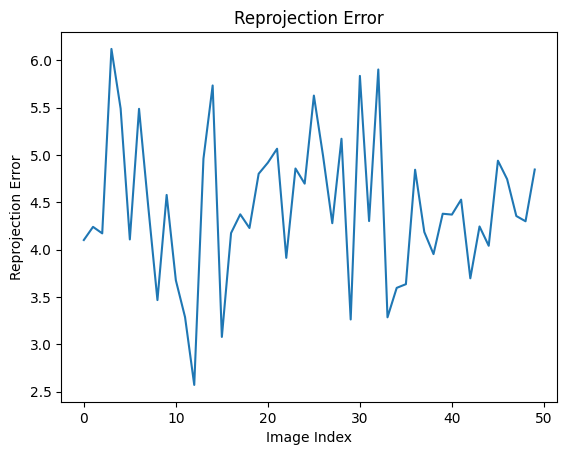

total error: 0.044362699777108654


In [ ]:
#Displaying the calculated error
plt.plot(reprojection_errors)
plt.xlabel('Image Index')
plt.ylabel('Reprojection Error')
plt.title('Reprojection Error')
plt.show()
print( "total error: {}".format(mean_error/len(objpoints)) )

# **Problem 2**

##Following is the explanation of the complete pipeline followed below:


* Identifying matching features between the two images using the SIFT feature detector and the Brute-Force Matcher.
* Estimating the Fundamental matrix using the RANSAC method based on the matched features.
* Computing the Essential matrix from the Fundamental matrix using the calibration parameters.
* Decomposing the Essential matrix into the rotation and translation matrices.
* **Rectification:**
* Applying perspective transformation to rectify the images and ensure horizontal epipolar lines.
* Printing the homography matrices (H1 and H2) for the rectification.
* Visualizing the epipolar lines and feature points on the rectified images.
* **Compute Depth Image:**
*(
The process of computing the depth image involves calculating the disparity map, which indicates pixel-wise differences between two rectified images. This map is then rescaled and converted into grayscale and color images using a heat map for visualization. By leveraging the disparity information, depth values are computed for each pixel, resulting in a depth image that accurately represents the spatial dimensions of the scene.)
* Calculating the disparity map representing the pixel-wise differences between the two rectified images.
* Rescaling the disparity map and saving it as grayscale and color images using a heat map conversion.
* Utilizing the disparity information to compute the depth values for each pixel.
* Generating a depth image representing the spatial dimensions of the scene and save it as grayscale and color images using a heat map conversion.

In [ ]:
# Load the image pairs and calibration data
path_to_folder = "ENPM673/tutorials/assets/camera_caliberation/stereo_camera/traproom"
%cd /content/drive/My\ Drive/{path_to_folder}

/content/drive/My Drive/ENPM673/tutorials/assets/camera_caliberation/stereo_camera/traproom


###Loading images and calib.txt

In [ ]:
def load_images_and_calib():
    # Load the image
    img0 = cv2.imread("im0.png")
    img1 = cv2.imread("im1.png")

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
    plt.title("Given img0")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
    plt.title("Given img1")
    plt.show()

    # Load the calibration data
    with open('calib.txt', 'r') as file:
        calib_data = file.read() #.splitlines()

    # Extract the camera matrices
    cam0_params = calib_data.split("cam0=[")[1].split("cam1=[")[0].strip()[1:-1].split(";")
    cam1_params = calib_data.split("cam1=[")[1].split("doffs=")[0].strip()[1:-1].split(";")
    baseline = float(calib_data.split("baseline=")[1].split("width=")[0].strip())
    img_width = int(calib_data.split("width=")[1].split("height=")[0].strip())
    img_height = int(calib_data.split("height=")[1].split("ndisp=")[0].strip())
    ndisp = int(calib_data.split("ndisp=")[1].split("vmin=")[0].strip())
    vmin = int(calib_data.split("vmin=")[1].split("vmax=")[0].strip())
    vmax = int(calib_data.split("vmax=")[1].strip())
    cam0_matrix = np.array([list(map(float, row.split())) for row in cam0_params])
    cam1_matrix = np.array([list(map(float, row.split())) for row in cam1_params])

    return img0, img1, baseline, img_width, img_height, ndisp, vmin, vmax, cam0_matrix, cam1_matrix


### Extracting matching features and implimenting RANSAC method

In [ ]:
def detect_and_compute_sift(img0, img1):
    # Create SIFT detector
    sift = cv2.SIFT_create()

    # Detect keypoints and compute descriptors for both images
    kp0, des0 = sift.detectAndCompute(img0, None)
    kp1, des1 = sift.detectAndCompute(img1, None)

    # Create BFMatcher object
    bf = cv2.BFMatcher()

    # Match descriptors using KNN method
    matches = bf.knnMatch(des0, des1, k=2)

    # Filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append([m])

    # Draw matches
    img_matches = cv2.drawMatchesKnn(img0, kp0, img1, kp1, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    # Display the image with matches using matplotlib
    plt.figure(figsize=(12, 6))
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for matplotlib
    plt.axis('off')  # Turn off axis labels
    plt.show()

    # Estimate the Fundamental matrix using RANSAC method based on the matched features
    pts0 = []
    pts1 = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            pts0.append(kp0[m.queryIdx].pt)
            pts1.append(kp1[m.trainIdx].pt)

    pts0 = np.array(pts0)
    pts1 = np.array(pts1)
    F, mask = cv2.findFundamentalMat(pts0, pts1, cv2.RANSAC)

    return kp0, des0, kp1, des1, good_matches, img_matches, pts0, pts1, F


###Computing essetial matrix and homographies

In [ ]:
def compute_essential_matrix(F, cam0_matrix, cam1_matrix, pts0, pts1, img_width, img_height):
    # Compute the Essential matrix from the Fundamental matrix considering calibration parameters
    E = np.dot(np.dot(cam1_matrix.T, F), cam0_matrix)

    # Decompose the Essential matrix into rotation and translation matrices
    _, R, t, _ = cv2.recoverPose(E, pts0, pts1)

    # Apply perspective transformation to rectify images and ensure horizontal epipolar lines
    rectification_result = cv2.stereoRectifyUncalibrated(pts0, pts1, F, imgSize=(img_width, img_height))

    # Unpack the return values into separate variables
    _, H1, H2 = rectification_result  # Ignore the last two outputs if not needed

    print("H1 =", H1, "\n")
    print("H2 =", H2)

    return H1, H2


###Rectified images, Epipolar lines and features

In [ ]:
def process_images(img0, img1, H1, H2, pts0, pts1, img_width, img_height):
    # Obtaining rectified images
    img0_rectified = cv2.warpPerspective(img0, H1, (img_width, img_height))
    img1_rectified = cv2.warpPerspective(img1, H2, (img_width, img_height))

    # Displaying rectified images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img0_rectified, cv2.COLOR_BGR2RGB))
    plt.title("Rectified Image 0")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img1_rectified, cv2.COLOR_BGR2RGB))
    plt.title("Rectified Image 1")
    plt.show()

    # Compute the epipolar lines and draw them on the rectified images
    lines1 = cv2.computeCorrespondEpilines(pts0.reshape(-1, 1, 2), 2, F)
    lines1 = lines1.reshape(-1, 3)
    img0_with_lines = img0_rectified.copy()
    for r, pt in zip(lines1, pts1):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [img_width, -(r[2] + r[0] * img_width) / r[1]])
        img0_with_lines = cv2.line(img0_with_lines, (x0, y0), (x1, y1), color, 1)

    lines0 = cv2.computeCorrespondEpilines(pts1.reshape(-1, 1, 2), 1, F)
    lines0 = lines0.reshape(-1, 3)
    img1_with_lines = img1_rectified.copy()
    for r, pt in zip(lines0, pts0):
        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = map(int, [0, -r[2] / r[1]])
        x1, y1 = map(int, [img_width, -(r[2] + r[0] * img_width) / r[1]])
        img1_with_lines = cv2.line(img1_with_lines, (x0, y0), (x1, y1), color, 1)

    # Displaying Epipolar Lines on images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img0_with_lines, cv2.COLOR_BGR2RGB))
    plt.title("Rectified Image 0 with Epipolar Lines")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img1_with_lines, cv2.COLOR_BGR2RGB))
    plt.title("Rectified Image 1 with Epipolar Lines")
    plt.show()

    # Visualize the feature points on both rectified images
    img0_with_points = cv2.drawKeypoints(img0_rectified, kp0, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    img1_with_points = cv2.drawKeypoints(img1_rectified, kp1, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Displaying Feature Points on images
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img0_with_points, cv2.COLOR_BGR2RGB))
    plt.title("Rectified Image 0 with Feature Points")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img1_with_points, cv2.COLOR_BGR2RGB))
    plt.title("Rectified Image 1 with Feature Points")
    plt.show()

    return img0_rectified, img1_rectified, img0_with_lines, img1_with_lines, img0_with_points, img1_with_points


###Computing Disparity and Depth

In [ ]:

def compute_depth_map(img0_rectified, img1_rectified, cam0_matrix, baseline, path_to_folder):
    # Convert images to grayscale
    img0_gray = cv2.cvtColor(img0_rectified, cv2.COLOR_BGR2GRAY)
    img1_gray = cv2.cvtColor(img1_rectified, cv2.COLOR_BGR2GRAY)

    # Calculate the disparity map using StereoSGBM algorithm
    stereo_sgbm = cv2.StereoSGBM_create(
        minDisparity=0,
        numDisparities=310,
        blockSize=11,
        P1=8 * 3 * 11 ** 2,
        P2=32 * 3 * 11 ** 2,
        disp12MaxDiff=1,
        uniquenessRatio=10,
        speckleWindowSize=100,
        speckleRange=32,
        mode=cv2.STEREO_SGBM_MODE_SGBM
    )
    disparity_sgbm = stereo_sgbm.compute(img0_gray, img1_gray)

    # Rescale and save the disparity map using StereoSGBM
    disp_img_sgbm = cv2.normalize(disparity_sgbm, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    disp_color_sgbm = cv2.applyColorMap(disp_img_sgbm, cv2.COLORMAP_JET)

    cv2.imwrite(path_to_folder + "disparity_grayscale_sgbm.png", disp_img_sgbm)
    cv2.imwrite(path_to_folder + "disparity_color_sgbm.png", disp_color_sgbm)

    # Utilize the disparity information to compute depth values for each pixel
    depth = cam0_matrix[0, 0] * baseline / (disparity_sgbm + 1e-6)

    # Generate a depth image representing the spatial dimensions of the scene
    depth_img = cv2.normalize(depth, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
    depth_color = cv2.applyColorMap(depth_img, cv2.COLORMAP_JET)

    # Save the depth images
    cv2.imwrite(path_to_folder + "depth_grayscale.png", depth_img)
    cv2.imwrite(path_to_folder + "depth_color.png", depth_color)

    # Display the disparity maps
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(disp_img_sgbm, cmap='gray')
    plt.title("Disparity Map (Grayscale)")
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(disp_color_sgbm, cv2.COLOR_BGR2RGB))
    plt.title("Disparity Map (Color)")
    plt.show()

    # Display the depth maps
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(depth_img, cmap='gray')
    plt.title("Depth Map (Grayscale)")
    plt.subplot(1, 2, 2)
    plt.imshow(depth_color)
    plt.title("Depth Map (Color)")
    plt.show()


### Now implimenting the functions:

### For Traproom

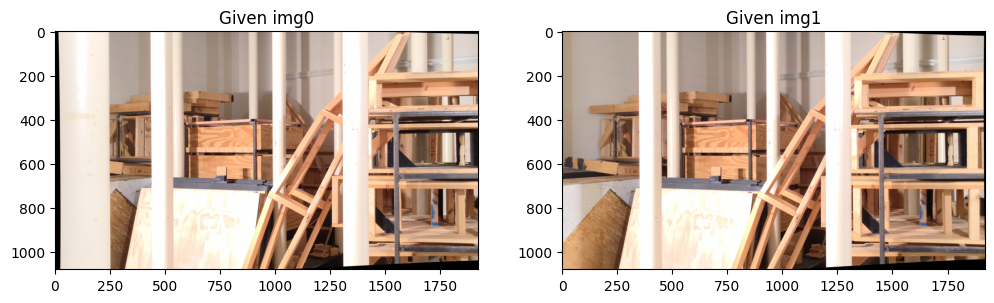

In [ ]:
img0, img1, baseline, img_width, img_height, ndisp, vmin, vmax, cam0_matrix, cam1_matrix = load_images_and_calib()

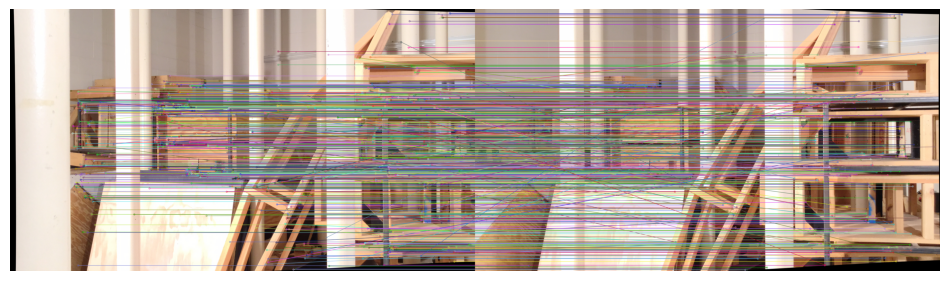

In [ ]:
kp0, des0, kp1, des1, good_matches, img_matches, pts0, pts1, F = detect_and_compute_sift(img0, img1)

In [ ]:
H1, H2 = compute_essential_matrix(F, cam0_matrix, cam1_matrix, pts0, pts1, img_width, img_height)

H1 = [[ 2.66110909e-01 -4.07066837e-03 -2.30933491e+01]
 [ 3.10953380e-03  2.54031672e-01 -1.22068680e+00]
 [ 1.83499324e-05 -5.16070538e-06  2.41400869e-01]] 

H2 = [[ 1.06148256e+00  2.77258378e-02 -7.39952131e+01]
 [ 8.66471388e-03  1.00056739e+00 -8.62451512e+00]
 [ 6.43994936e-05  1.68210951e-06  9.37268147e-01]]


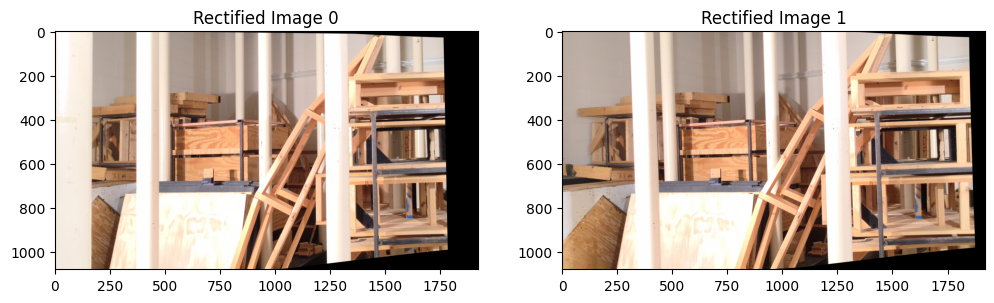

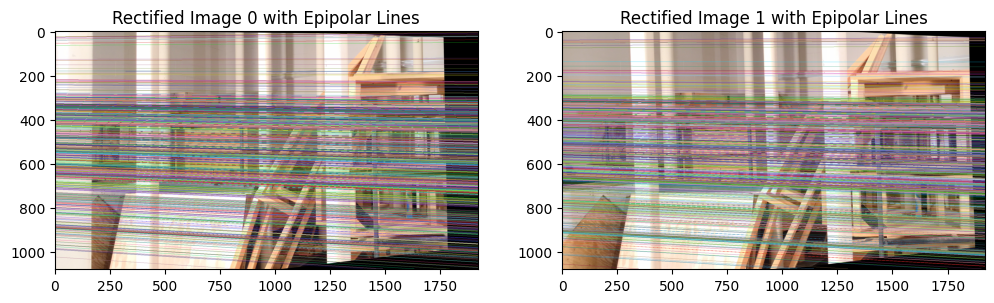

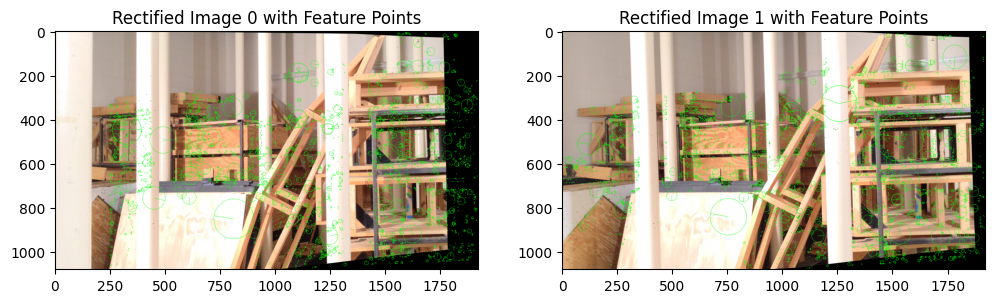

In [ ]:
img0_rectified, img1_rectified, img0_with_lines, img1_with_lines, img0_with_points, img1_with_points = process_images(img0, img1, H1, H2, pts0, pts1, img_width, img_height)

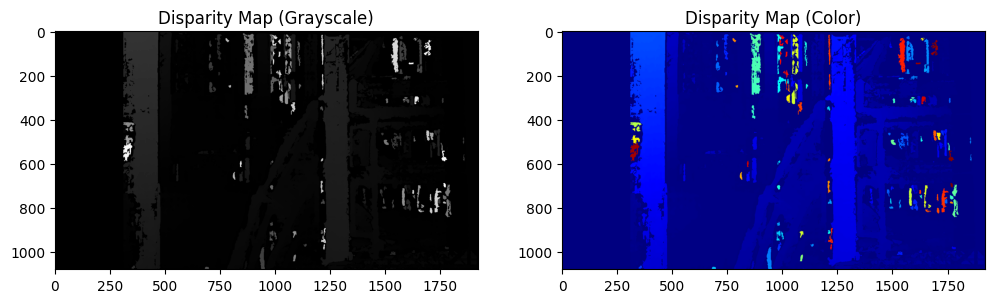

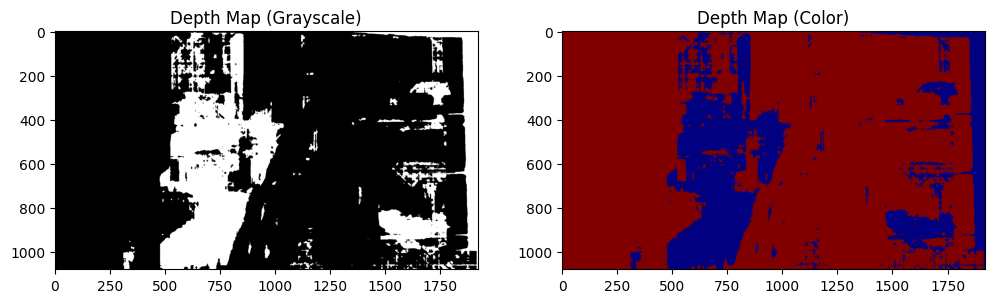

In [ ]:
compute_depth_map(img0_rectified, img1_rectified, cam0_matrix, baseline, path_to_folder)

### For Classroom




In [ ]:
# Load the image pairs and calibration data
path_to_folder = "ENPM673/tutorials/assets/camera_caliberation/stereo_camera/classroom"
%cd /content/drive/My\ Drive/{path_to_folder}

/content/drive/My Drive/ENPM673/tutorials/assets/camera_caliberation/stereo_camera/classroom


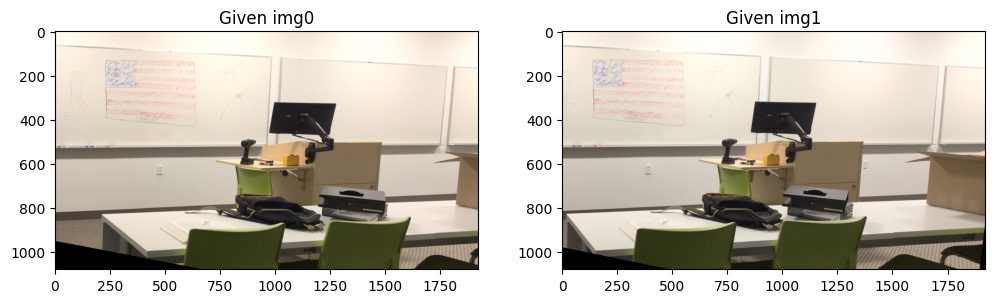

In [ ]:
img0, img1, baseline, img_width, img_height, ndisp, vmin, vmax, cam0_matrix, cam1_matrix = load_images_and_calib()

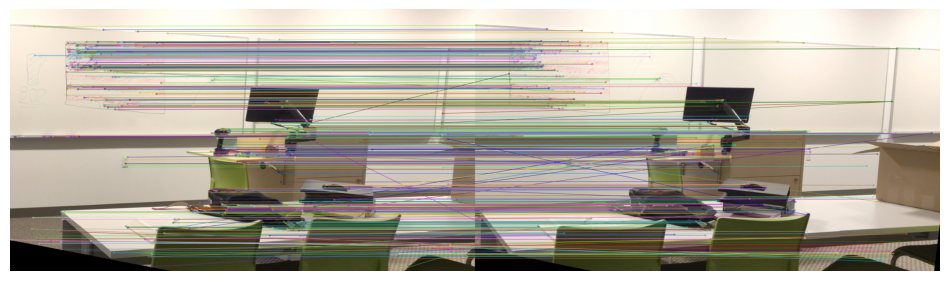

In [ ]:
kp0, des0, kp1, des1, good_matches, img_matches, pts0, pts1, F = detect_and_compute_sift(img0, img1)

In [ ]:
H1, H2 = compute_essential_matrix(F, cam0_matrix, cam1_matrix, pts0, pts1, img_width, img_height)

H1 = [[-1.75483204e-01  3.24737183e-02  9.60564667e+00]
 [-8.02449655e-03 -1.69813524e-01  8.76156204e+00]
 [-4.04791061e-06 -1.63742337e-09 -1.66396914e-01]] 

H2 = [[ 1.02341339e+00 -3.53660205e-02 -3.37920301e+00]
 [ 4.80419052e-02  9.98936732e-01 -4.55460642e+01]
 [ 2.50103604e-05 -8.64281169e-07  9.76456766e-01]]


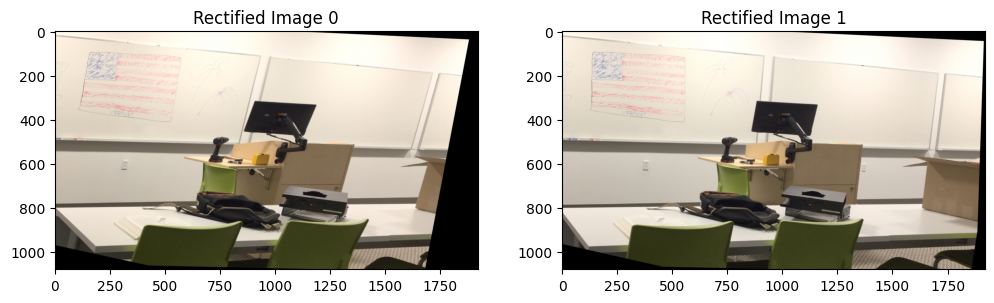

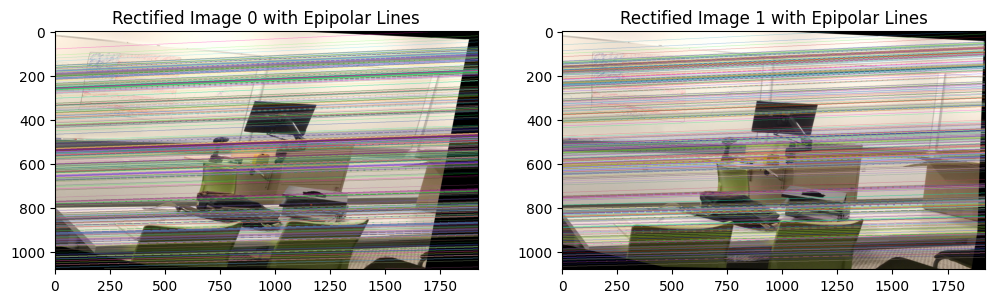

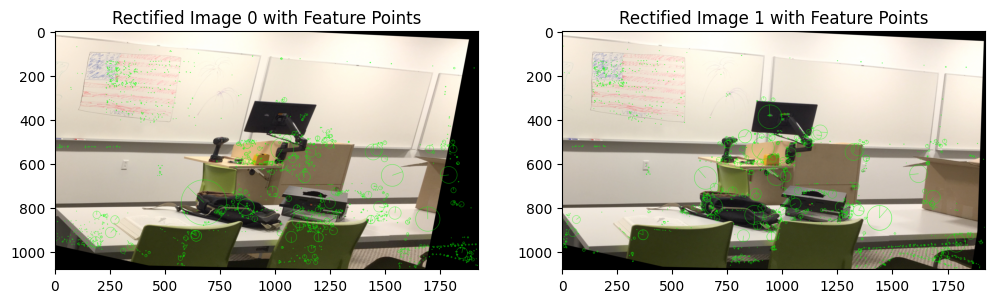

In [ ]:
img0_rectified, img1_rectified, img0_with_lines, img1_with_lines, img0_with_points, img1_with_points = process_images(img0, img1, H1, H2, pts0, pts1, img_width, img_height)

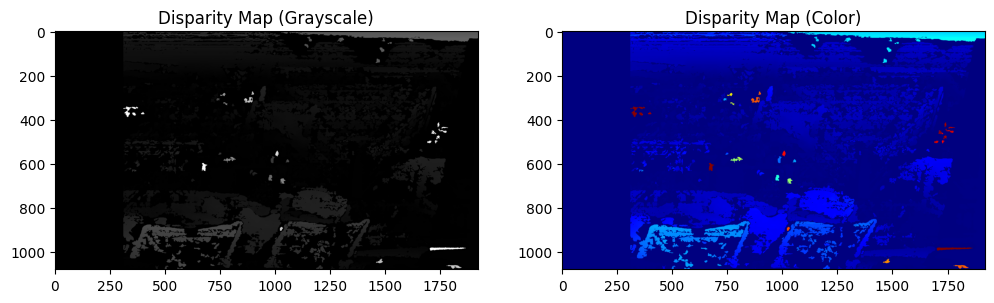

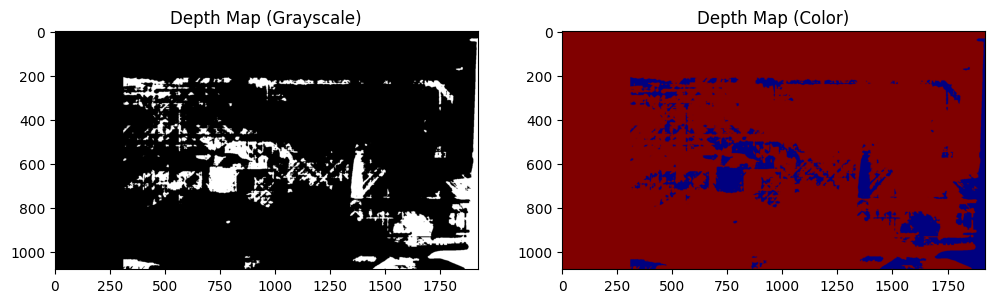

In [ ]:
compute_depth_map(img0_rectified, img1_rectified, cam0_matrix, baseline, path_to_folder)

##For Storageroom

In [ ]:
# Load the image pairs and calibration data
path_to_folder = "ENPM673/tutorials/assets/camera_caliberation/stereo_camera/storageroom"
%cd /content/drive/My\ Drive/{path_to_folder}

/content/drive/My Drive/ENPM673/tutorials/assets/camera_caliberation/stereo_camera/storageroom


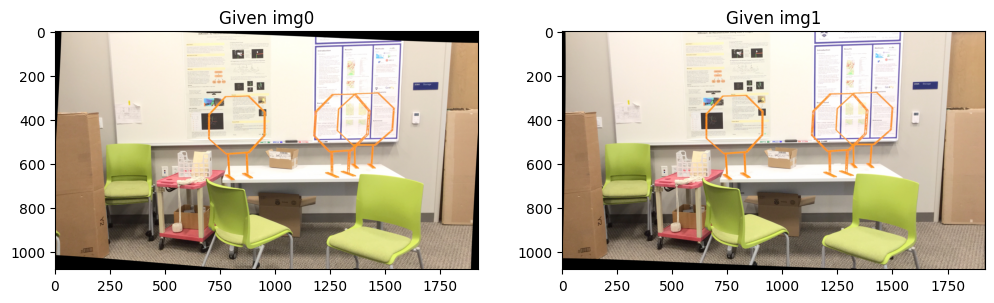

In [ ]:
img0, img1, baseline, img_width, img_height, ndisp, vmin, vmax, cam0_matrix, cam1_matrix = load_images_and_calib()

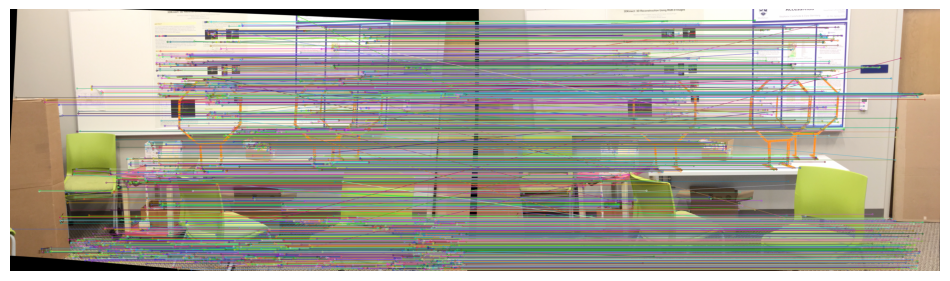

In [ ]:
kp0, des0, kp1, des1, good_matches, img_matches, pts0, pts1, F = detect_and_compute_sift(img0, img1)

In [ ]:
H1, H2 = compute_essential_matrix(F, cam0_matrix, cam1_matrix, pts0, pts1, img_width, img_height)

H1 = [[-5.47887042e-01 -1.54891599e-02 -8.34848088e+01]
 [ 9.09415565e-02 -6.63054343e-01 -8.98785436e+01]
 [ 1.20822669e-04  4.99518197e-06 -7.87949996e-01]] 

H2 = [[ 8.25118815e-01  3.13196495e-02  1.50973327e+02]
 [-1.35896311e-01  9.95561818e-01  1.32857077e+02]
 [-1.81418299e-04 -6.88622952e-06  1.17788013e+00]]


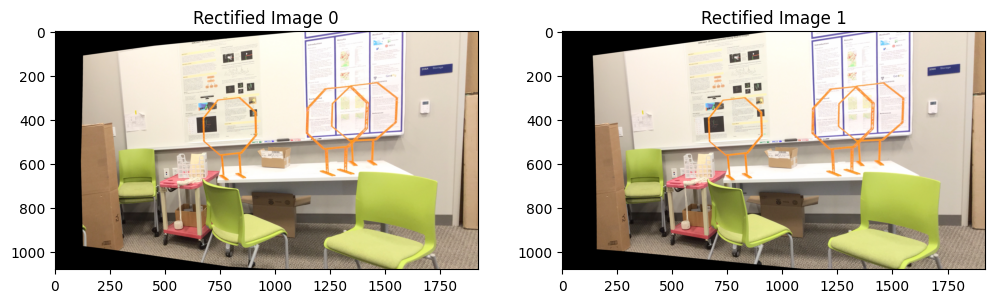

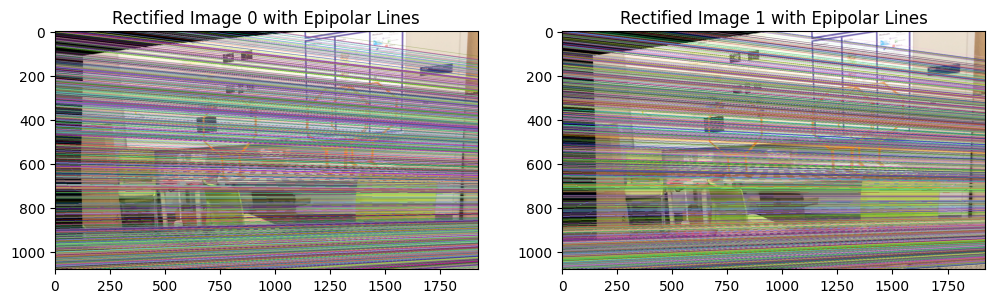

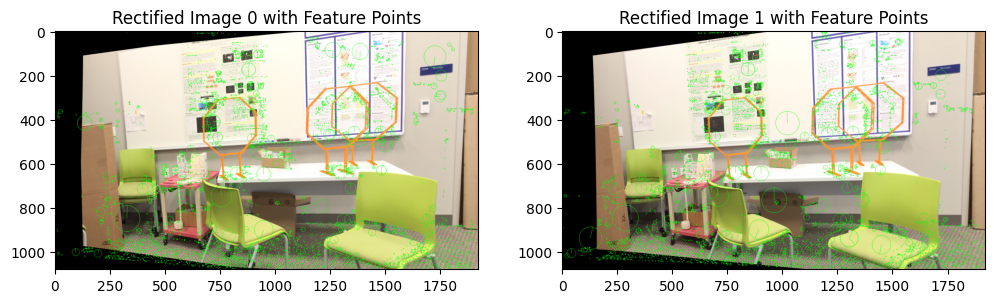

In [ ]:
img0_rectified, img1_rectified, img0_with_lines, img1_with_lines, img0_with_points, img1_with_points = process_images(img0, img1, H1, H2, pts0, pts1, img_width, img_height)

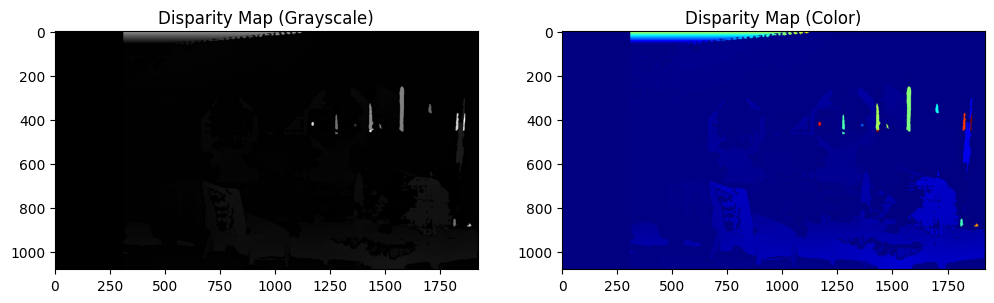

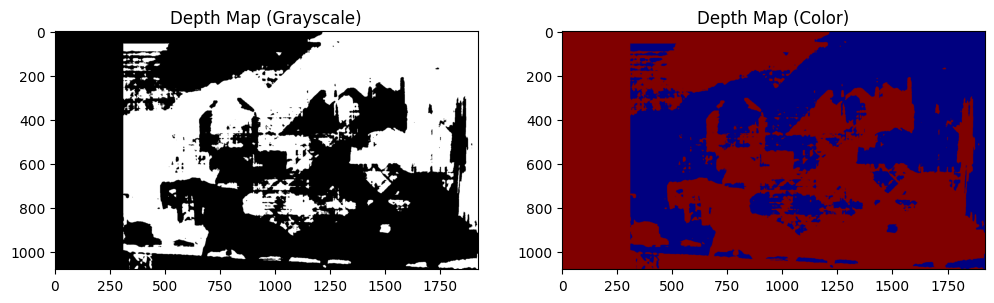

In [ ]:
compute_depth_map(img0_rectified, img1_rectified, cam0_matrix, baseline, path_to_folder)